# Clase 4: Procesamiento de señales e imágenes
----

En el campo de la ciencia de datos es necesario caracterizar a lo que se está estudiando (libros, datos biomédicos, datos financieros etc.). Para esto se realizan mediciones de propiedades sobre cada observación. Existen dos tipos de datos para representar estas observaciones, estos son:

* Datos estructurados
    * Sensores
    * Precios
    * Edad
    * Género
    * Dimensiones
* Datos no estructurados
    * Texto
    * Señales
    * Imágenes

Para poder analizar los datos no estructurados es necesario primero realizar un procesamiento para poder reducir los datos, así como filtrar poible ruido y elementos no necesarios o mejorar la calidad de los mismos. Finalmente se realiza la extracción de características.

## Señales

Las señales son mediciones variantes en el tiempo de algún fenómeno a estudiar. Es decir representan una variable cuyo valor no es constante y la información de la misma se encuentra en el comportamiento de esta.

Las señales se pueden catalogar en dos grupos, los cuales son:
* Señales determinísticas: Están definidas por una función en el tiempo (e.g. senoidal, triangular).
* Señales estocásticas: Son resultado de procesos complejos (e.g. sonido, ECG).

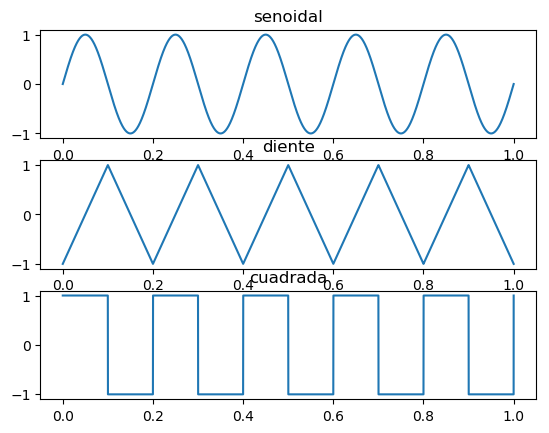

In [5]:
%matplotlib inline
from __future__ import print_function, division
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('default')
# Libreria de scipy para procesamiento de señales
from scipy import signal

# Frecuencia de muestreo (Hz)
fs = 10000
# Duración total (segundos)
T = 1
# Frecuencia
f = 5

t = np.linspace(0, T, fs)
senoidal = np.sin(2 * np.pi * f * t)
diente = signal.sawtooth(2 * np.pi * f * t, width=0.5)
cuadrada = signal.square(2 * np.pi * f * t, duty=0.5)

signals = (senoidal, diente, cuadrada)
nombres = ('senoidal', 'diente','cuadrada')
for i, c in enumerate(signals):
    plt.subplot(len(signals), 1, i+1)
    plt.title(nombres[i])
    plt.plot(t, c)

Text(0.5,1,'Ruido gaussiano')

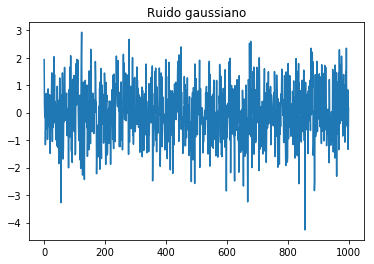

In [2]:
Y = np.random.randn(1000)
plt.plot(Y)
plt.title('Ruido gaussiano')

## Analisis de tendencias
Otros tipos de mediciones pueden ser transformados como señales cuando se tiene una medición en el tiempo de estos para así obtener características de los mismos.

In [3]:
import pandas as pd
df = pd.read_csv('data/international-airline-passengers.csv')
df['Month'] = pd.to_datetime(df['Month'])

In [4]:
df.head()

,Month,Thousand Passengers
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121


In [5]:
# Se toma el valor de pasajeros por mes para cada periodo 
ps = df['Thousand Passengers']

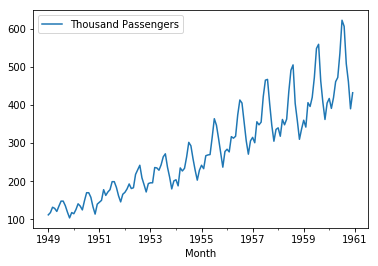

In [6]:
df.plot(x='Month')

Text(0.5,1,'Fase')

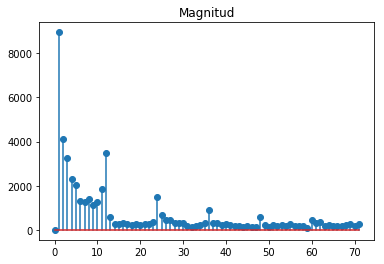

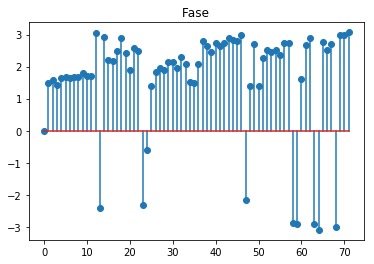

In [7]:
# Transformada rapida de Fourier
ff = np.fft.fft(ps-ps.mean())
plt.subplots()
plt.stem(np.abs(ff[:int(len(ff)/2)]))
plt.title('Magnitud')
plt.subplots()
plt.stem(np.angle(ff[:int(len(ff)/2)]))
plt.title('Fase')

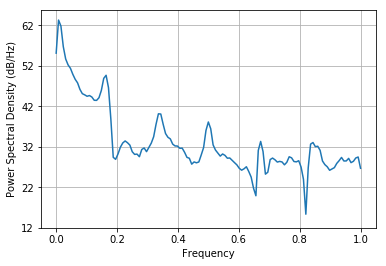

In [8]:
# Power Spectral Density
psd = plt.psd(ps,
             detrend='mean',
             )

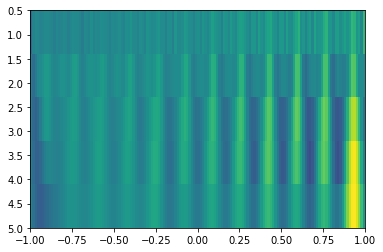

In [9]:
# Transformada continua wavelet
b = 0.5
w = 5
width = np.arange(b,w)
psW = signal.cwt(ps-ps.mean(), signal.ricker, width)

# Mostrar espectrograma
plt.imshow(psW, extent=[-1, 1, w, b], aspect='auto',
            vmax=abs(psW).max(), vmin=-abs(psW).max())

### Transformada Discreta Wavelet 

La transformada discreta wavelet (DWT) permite usar un banco de filtros dependiente de una _mother wavelet_ para obtener la energía de la señal en momentos específicos de la misma y en diferentes rangos de frecuencia.

Los datos resultantes se llaman aproximación y detalles, donde la aproximación contiene los datos de menor frecuencia y los detalles de mayo frecuencia sucesivamente. 

In [10]:
# Libreria de wavelets
import pywt
# Descomposición de 2 niveles
(cA, cD) = pywt.dwt(ps, 'db2')

In [11]:
print(np.shape(cA))
print(np.shape(cD))

(73,)
(73,)


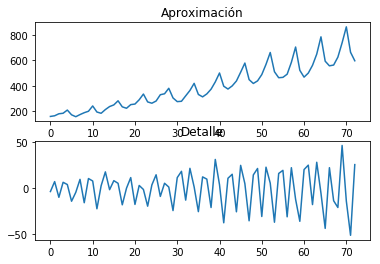

In [12]:
titulos = ['Aproximación', 'Detalle']
for i, c in enumerate((cA, cD)):
    plt.subplot(2, 1, int(i+1))
    plt.title(titulos[i])
    plt.plot(c)

In [13]:
# Descomposicion de mas niveles
coeffs = pywt.wavedec(ps, 'db2', level=3)
print(np.shape(coeffs))

(4,)


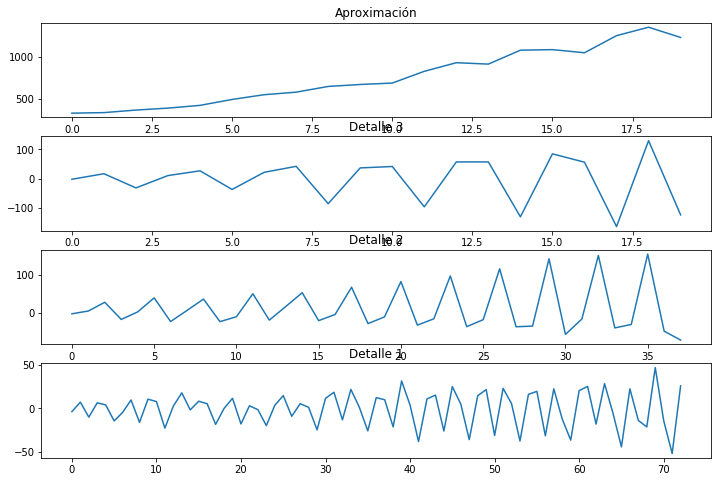

In [14]:
plt.figure(figsize=(12,8))
titulos = ['Aproximación', 'Detalle 3', 'Detalle 2', 'Detalle 1']
for i, c in enumerate(coeffs):
    plt.subplot(len(coeffs), 1, i+1)
    plt.title(titulos[i])
    plt.plot(c)
    

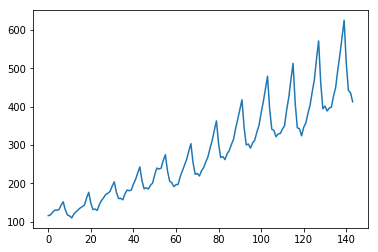

In [15]:
# Eliminar las ultimas componentes
coeffs[3] *= 0
# Reconstruir la señal con wavrec
ps_rec = pywt.waverec(coeffs, 'db2')
plt.plot(ps_rec)

## Filtrado

La medición de una señal puede ser alterada debido a ruido proveniente de diversas fuentes (otras señales biológicas, estática, linea de alimentación (60 Hz)). Es por esto que se han desarrollado métodos para atenuar estas componentes no deseadas.

Un filtro en frecuencia es una función lineal no variante en el tiempo que posee una respuesta dependiente de la frecuencia con la cual entra la señal. La respuesta del filtro a la frecuencia dependerá de:

* Tipo de filtro:
    * IIR: Posee feedback, pocos componentes, fase no lineal
    * FIR: No requiere feedback, más componentes, fase lineal
* Función:
    * Pasa-bajas: Atenua las componentes de la señal con frecuencias después de su frecuencia de corte.
    * Pasa-altas: Atenua las componentes de la señal con frecuencias antes de su frecuencia de corte.
    * Pasa-banda: Atenua las componentes fuera de su banda de paso.
* Orden:
    * El orden de la atenuación del filtro. (Nota: Un filtro de alto orden puede eliminar las componentes fuera del rango, pero puede alterar la forma de la señal que se desea analizar)

Algunos de los tipos de filtros disponibles para Python en Scipy son los siguientes:
* IIR
    * Butterworth
    * Chebyshev I
    * Chebyshev II
    * Elíptico
* FIR
    * Mínimos cuadrados
    * Ventana

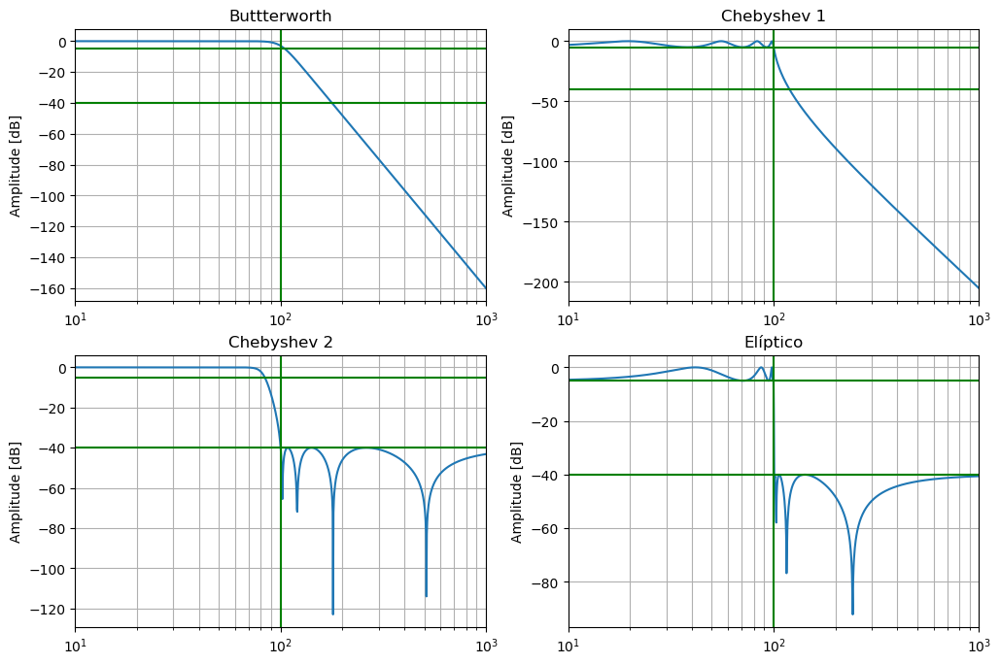

In [6]:
order = 8
freq = 100
rs1 = 5
rs2 = 40
filters = [signal.butter(order, freq, analog=True),
           signal.cheby1(order, rs1, freq, analog=True),
           signal.cheby2(order, rs2, freq, analog=True),
           signal.ellip(order, rs1, rs2, freq, analog=True)]
titles = ['Buttterworth',
         'Chebyshev 1',
         'Chebyshev 2',
         'Elíptico']

plt.figure(figsize=(12,8))
for i, c in enumerate(filters):
    plt.subplot(2, 2, i+1)
    b, a = filters[i]
    w, h = signal.freqs(b, a, worN=1000)
    plt.semilogx(w, 20 * np.log10(abs(h)))
    #plt.xlabel('Frequency [radians / second]')
    plt.ylabel('Amplitude [dB]')
    #plt.margins(0, 0.1)
    plt.xlim((10, 1000)) 
    plt.grid(which='both', axis='both')
    plt.axvline(100, color='green') # cutoff frequency
    plt.axhline(-rs1, color='green') # rp
    plt.axhline(-rs2, color='green') # rp
    plt.title(titles[i])

plt.show()
    


In [17]:
sn1 = pd.read_csv('Senales/100.csv')
sn1.describe()

,'sample #','MLII','V5'
count,650000.000000,650000.000000,650000.000000
mean,324999.500000,962.740205,985.793114
std,187638.981824,38.639938,29.642668
min,0.000000,481.000000,531.000000
25%,162499.750000,946.000000,971.000000
50%,324999.500000,957.000000,983.000000
75%,487499.250000,970.000000,995.000000
max,649999.000000,1311.000000,1269.000000


C:\Users\DAYOF\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """


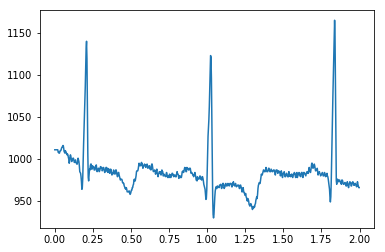

In [18]:
# Mostrar parte de la señal
fs = 360
T = 2
t = np.linspace(0, 2-1/fs, fs * T)
sn1_1 = sn1.as_matrix()
# Seleccionar un canal
sn1_1 = sn1_1[:,2]
sn1_1
plt.plot(t, sn1_1[:len(t)])

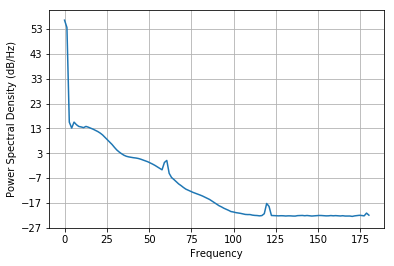

In [19]:
# Visualizar frecuencias con PSD
psd = plt.psd(sn1_1, 
              Fs=fs)

In [20]:
# Crear filtro pasa-baja
b, a = signal.butter(4, 70/(fs/2))

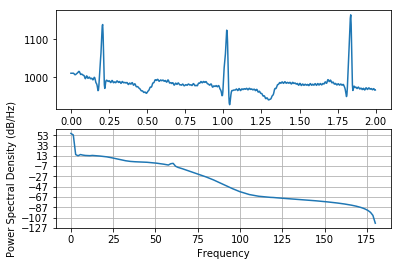

In [21]:
# Filtrar señal 
pasa_baja = signal.filtfilt(b, a, sn1_1)
plt.subplot(211)
plt.plot(t, pasa_baja[:len(t)])
plt.subplot(212)
psd = plt.psd(pasa_baja, Fs=fs)

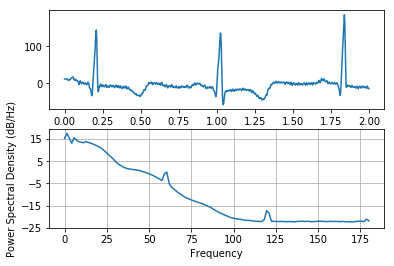

In [22]:
# Pasa-alta
b, a = signal.butter(2, 0.15/(fs/2), 'high')
pasa_alta = signal.filtfilt(b, a, sn1_1)
plt.subplot(211)
plt.plot(t, pasa_alta[:len(t)])
plt.subplot(212)
psd = plt.psd(pasa_alta, Fs=fs)

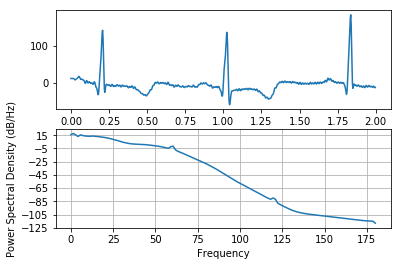

In [23]:
# Pasa-banda
b, a = signal.butter(4, [0.15/(fs/2), 70/(fs/2)], 'bandpass')
pasa_banda = signal.filtfilt(b, a, sn1_1)
plt.subplot(211)
plt.plot(t, pasa_banda[:len(t)])
plt.subplot(212)
psd = plt.psd(pasa_banda, Fs=fs)

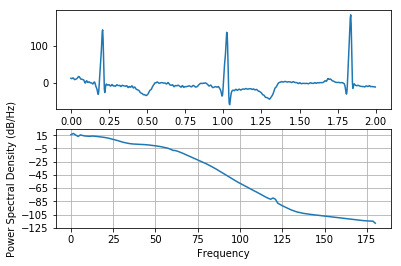

In [24]:
# Filtro Notch
b, a = signal.butter(4, [59.8/(fs/2), 60.2/(fs/2)], 'bandstop')
rechaza_banda = signal.filtfilt(b, a, pasa_banda)
plt.subplot(211)
plt.plot(t, rechaza_banda[:len(t)])
plt.subplot(212)
psd = plt.psd(rechaza_banda,
       Fs=fs)

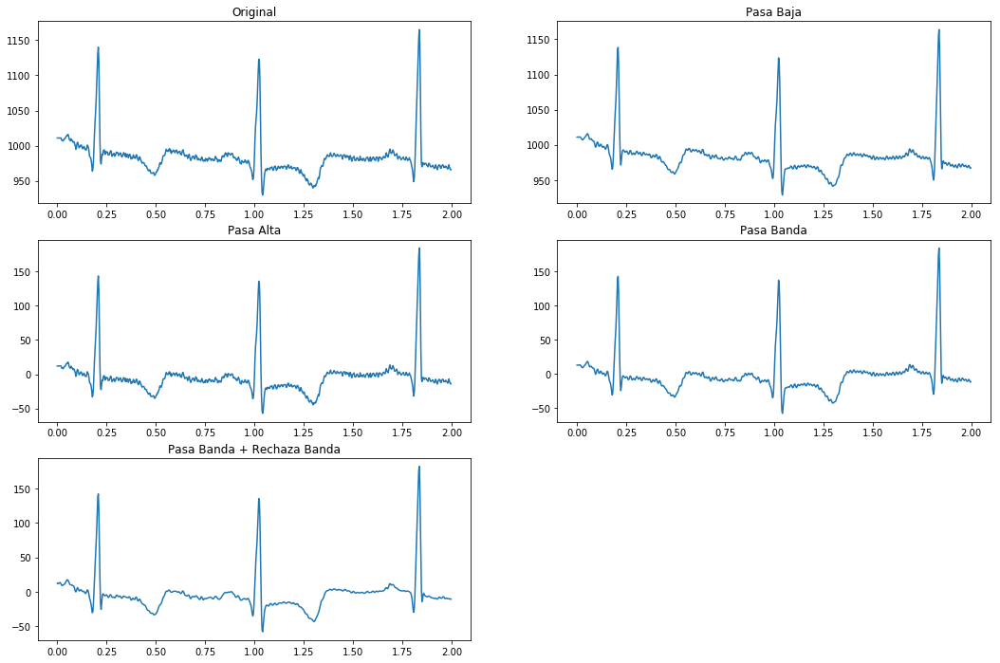

In [25]:
titulos = ['Original', 'Pasa Baja', 'Pasa Alta', 'Pasa Banda', 'Pasa Banda + Rechaza Banda']
senales =(sn1_1, pasa_baja, pasa_alta, pasa_banda, rechaza_banda)
plt.figure(figsize=(18,12))
for i, c in enumerate(senales):
    plt.subplot(3, 2, i + 1)
    plt.title(titulos[i])
    plt.plot(t, c[:len(t)])

# Filtro estadístico
La función para los nuevos valores está dada por una función estadística que toma muestras de la señal e intenta crear un estimado de la señal sin ruido.

Text(0.5,1,'Filtro media')

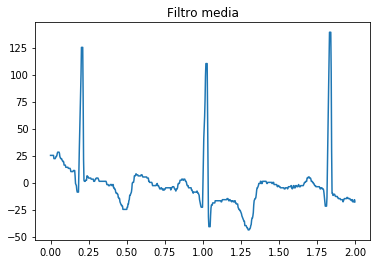

In [26]:
# Filtro media de 7 muestras
med = signal.medfilt(sn1_1, 7)
plt.plot(t, med[:len(t)] - sn1_1.mean())
plt.title('Filtro media')

Text(0.5,1,'Filtro Wiener')

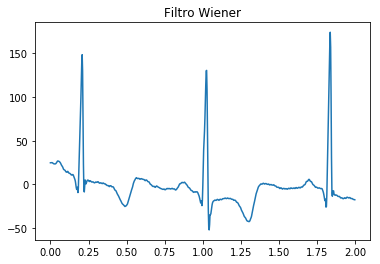

In [27]:
# Filtro de Wiener
wie = signal.wiener(sn1_1, 10)
plt.plot(t, wie[:len(t)] - sn1_1.mean())
plt.title('Filtro Wiener')

### Audio

Python tiene capacidades de cargar una señal de audio como un vector de numpy. Junto a esto se carga su frecuencia de muestreo a la cual fue tomada.


In [28]:
from scipy.io import wavfile
from IPython.display import Audio

fs, senal = wavfile.read('Another.wav')
Audio(data=senal, rate=fs)

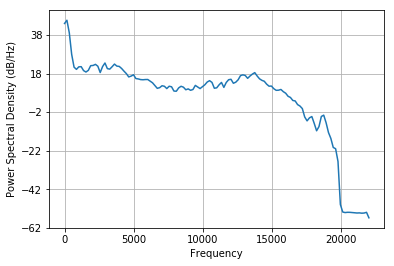

In [29]:
ps = plt.psd(senal, Fs=fs)

## Procesamiento de Imágenes

Una imagen en el concepto de programación es considerada como una matriz en la cual cada elemento representa el valor de un pixel. Así como en las señales la información se encuentra en su comportamiento en el tiempo, en el caso de las imágenes se pude suponer que la información se encuentra en su comportamiento espacial.

Una imagen puede encontrarse en diversos formatos, para el caso en que la imagen se represente con una sola matriz se dice que está compuesta de una sola capa. En este caso la imagen por lo general se encuentra en escala de grises.

En caso de que una imagen contenga más de una matriz se dice que lo componen canales, estos canales codifican de manera diferente la información de cada pixel. Existen diversos formatos para la codificación de imágenes, algunos de los más comunes son los siguientes:

* RGB: Canales rojo, verde y azul.
* HSV: Canales tono, saturación y brillo.
* CMYK: Canales cyan, magenta, amarillo y negro.

In [30]:
from scipy import ndimage

In [31]:
# Lectura de imagen en escala de grises
ima_g = ndimage.imread('Class3D/canasta.jpg', flatten=True)
print(np.shape(ima_g))

C:\Users\DAYOF\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0.
Use ``matplotlib.pyplot.imread`` instead.
  


(875, 1280)


(-0.5, 1279.5, 874.5, -0.5)

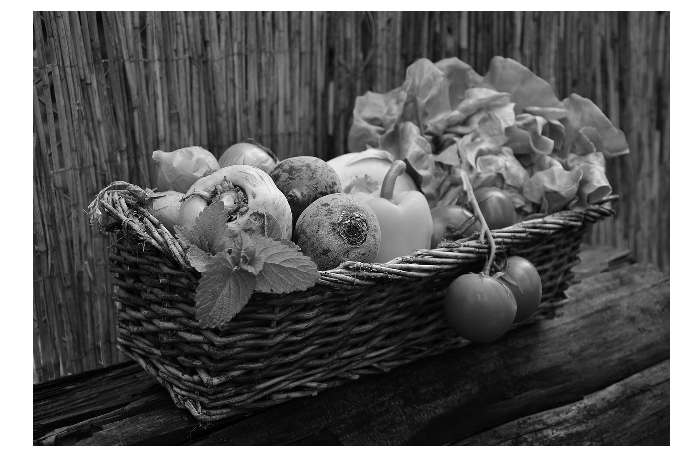

In [32]:
plt.figure(figsize=(12,8))
plt.imshow(ima_g, cmap='gray')
plt.axis('off')

In [33]:
# Lectura de imagen RGB
ima = plt.imread('Class3D/canasta.jpg')
print(np.shape(ima))

(875, 1280, 3)


(-0.5, 1279.5, 874.5, -0.5)

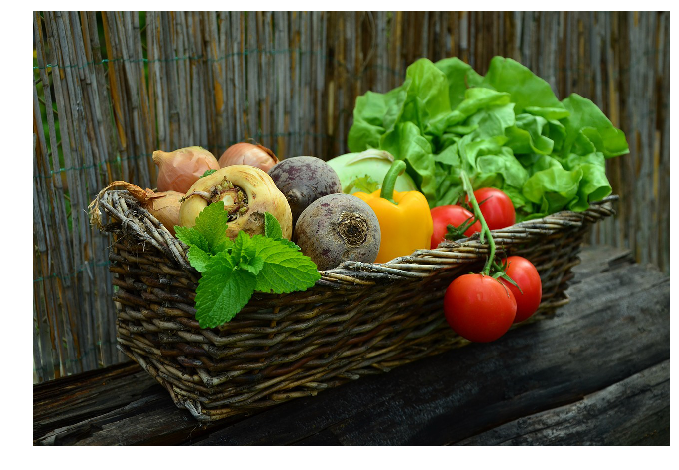

In [34]:
plt.figure(figsize=(12,8))
plt.imshow(ima)
plt.axis('off')

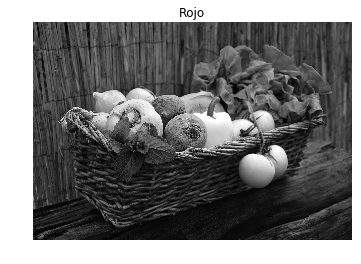

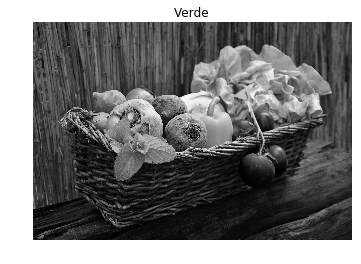

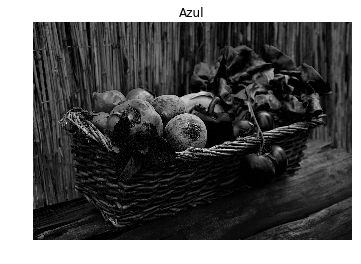

In [35]:
# Canales de la imagen
titulos = ['Rojo', 'Verde', 'Azul']
for i in range(3):
    plt.subplots()
    plt.title(titulos[i])
    plt.imshow(ima[:, :, i], cmap='gray')
    plt.axis('off')

In [36]:
# Representación en HSV

from matplotlib import colors
ima_hsv = colors.rgb_to_hsv(ima)
print(np.shape(ima_hsv))

(875, 1280, 3)


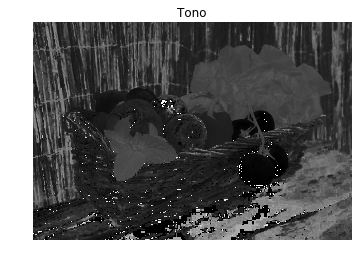

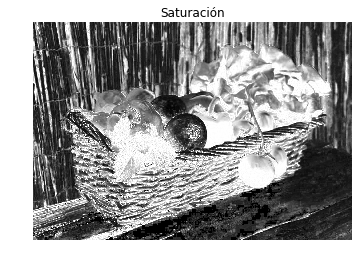

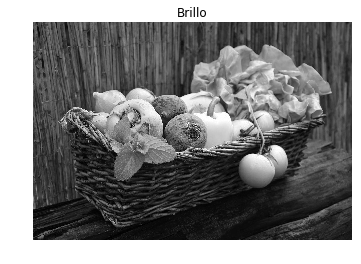

In [37]:
# Canales de la imagen
titulos = ['Tono', 'Saturación', 'Brillo']
for i in range(3):
    plt.subplots()
    plt.title(titulos[i])
    plt.imshow(ima_hsv[:, :, i], cmap='gray')
    plt.axis('off')

### Histograma 

El histograma de una imagen dice muchos datos acerca de la distribución de pixeles en ella. A partir de esto podremos hacer correcciones y modificaciones para adaptarla a nuestras necesidades. 

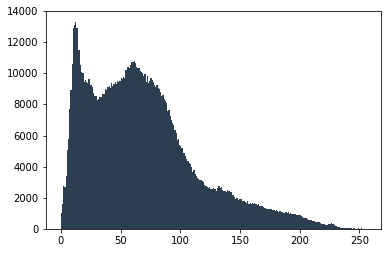

In [38]:
# Histograma para imagen en escala de grises
histograma = plt.hist(ima_g.ravel(),
                      bins=255,
                      range=[0, 255], color='#2c3e50')

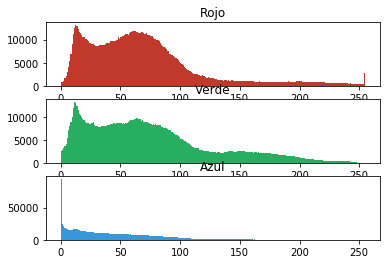

In [39]:
# Histograma por canal en RGB
titulos = ['Rojo', 'Verde', 'Azul']
colores = ['#c0392b', '#27ae60', '#3498db']
for i in range(3):
    plt.subplot(3, 1, i+1)
    plt.title(titulos[i])
    histograma = plt.hist(ima[:,:,i].ravel(),
                      bins=255,
                      range=[0, 255],
                      color=colores[i])

### Umbralizado 

La umbralización en procesamiento de imagenes establece un valor con el cual se binariza la imagen.

In [2]:
# Cargar widgets para graficas interactivas
import ipywidgets as widgets 
from IPython.display import display
from skimage import data


# Imagen a usar 
plt.figure(figsize=(12, 4))
camera = data.camera()
plt.subplot(121)
plt.imshow(camera, cmap='gray')
plt.axis('off')
plt.subplot(122)
plt.hist(camera.ravel(),bins=255,
                      range=[0, 255] )
plt.show()

NameError: name 'plt' is not defined

In [1]:
def mod_umbral(umbral):
    #thr = 60
    #ax.clear()
    plt.figure(1, figsize=(6,4))
    ima_bw = camera > umbral
    plt.imshow(ima_bw, cmap='gray')
    plt.axis('off')
    plt.show()

interactive_plot = widgets.interactive(mod_umbral, umbral=(30, 210))
output=interactive_plot.children[-1]
interactive_plot


NameError: name 'widgets' is not defined

In [42]:
# Método automático de Otsu
from skimage import filters
val = filters.threshold_otsu(ima_g)
ima_otsu = camera > val
print(val)

85.62283828854561


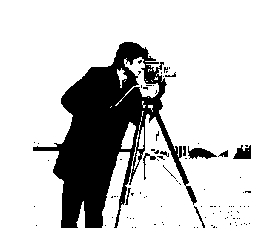

In [43]:
ima_otsu = camera > val
plt.imshow(ima_otsu, cmap='gray')
plt.axis('off')
plt.show()

### Modificación de parámetros de la imagen

Algunos de los parámetros para mejorar en una imagen son:
* Brillo
* Gamma

Estas corresponden a operaciones matemáticas sobre toda la matriz de datos.

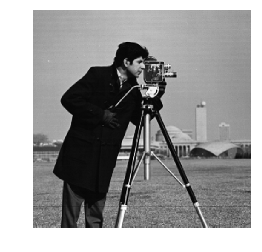

In [44]:
# El parámetro brillo se puede modificar sumando o restando un valor a toda la imagen
def mod_brillo(brillo):
    #thr = 60
    #ax.clear()
    plt.figure(1, figsize=(6,4))
    ima_brillo = np.int16(camera) + brillo
    plt.imshow(ima_brillo, cmap='gray', 
               vmin=0, vmax=255)
    plt.axis('off')
    plt.show()

interactive_plot = widgets.interactive(mod_brillo, brillo=(-70, 70))
output=interactive_plot.children[-1]
interactive_plot

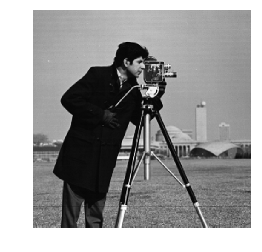

In [45]:
# EL parámetro gamma se puede modificar elevando la imagen a una potencia ya sea mayor o menor a 1.
def mod_gamma(gamma):
    #thr = 60
    #ax.clear()
    plt.figure(1, figsize=(6,4))
    ima_gamma = np.int16(camera) ** gamma
    plt.imshow(ima_gamma, cmap='gray', 
               vmin=0, vmax=255)
    plt.axis('off')
    plt.show()

interactive_plot = widgets.interactive(mod_gamma, gamma=(0.5, 1.5))
output=interactive_plot.children[-1]
interactive_plot

### Ecualización de histograma

La ecualización de histograma es un algoritmo que permite obtener un estimado de los valores que han de tener los pixeles en una nueva imagen de manera que su distribución sea lineal. 
Esto permite una mejora en el contraste logrando que se use completamente el rango de valores posibles para la imagen, mejorando el brillo y la gamma automáticamente.

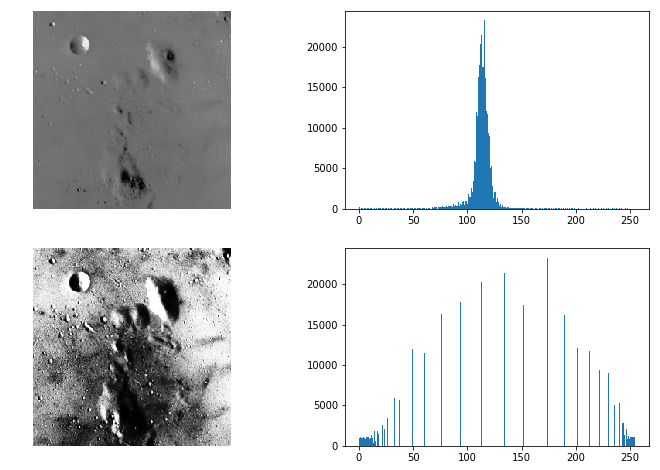

In [46]:
from skimage import exposure

moon = data.moon()
img_eq = exposure.equalize_hist(moon) * 255

plt.figure(figsize=(12, 8))
plt.subplot(221)
plt.imshow(moon, cmap='gray')
plt.axis('off')
plt.subplot(222)
plt.hist(moon.ravel(),bins=255,
                      range=[0, 255] )

plt.subplot(223)
plt.imshow(img_eq, cmap='gray')
plt.axis('off')
plt.subplot(224)
plt.hist(img_eq.ravel(),bins=255,
                      range=[0, 255] )
plt.show()

## Filtros

Una imagen también se puede entender como una señal bidimensional, como tal también se pueden aplicar filtros para generar nuevas visualizaciones de la imagen y resaltar elementos de interés para el usuario.

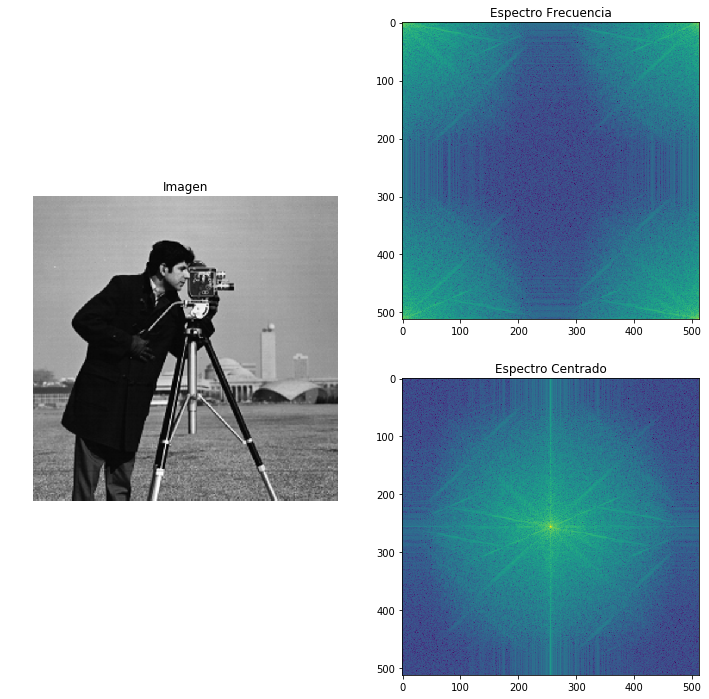

In [47]:
# Representación en frecuencia de una imagen
from scipy import fftpack

# Transformada de Fourier bidimensional
def mostrar_frecuencia(Ima):
    F = fftpack.fft2(Ima)
    F2 = fftpack.fftshift(F)
    plt.figure(figsize=(12,12))
    plt.subplot(121)
    plt.imshow(Ima, cmap='gray',
              vmin=0,
              vmax=255)
    plt.axis('off')
    plt.title('Imagen')
    plt.subplot(222)
    plt.imshow(np.log(np.abs(F)+1))
    plt.title('Espectro Frecuencia')
    plt.subplot(224)
    plt.imshow(np.log(np.abs(F2)+1))
    plt.title('Espectro Centrado')
    plt.show()

mostrar_frecuencia(camera)

### Operadores de convolución

Para las tecnicas de filtrado se hacen uso de _kernels_ de convolución, el principio de su funcionamiento es que se puede recordar que par un sistema lineal la operación de convolución en el espacio del tiempo es igual a la de multiplicación en el espacio de frecuencia. 

Algunos operadores comunes son los siguientes:

* Media
* Blur
* Sobel (horizontal y vertical)
* Realce
* Bordes
* Énfasis
* Gaussiano

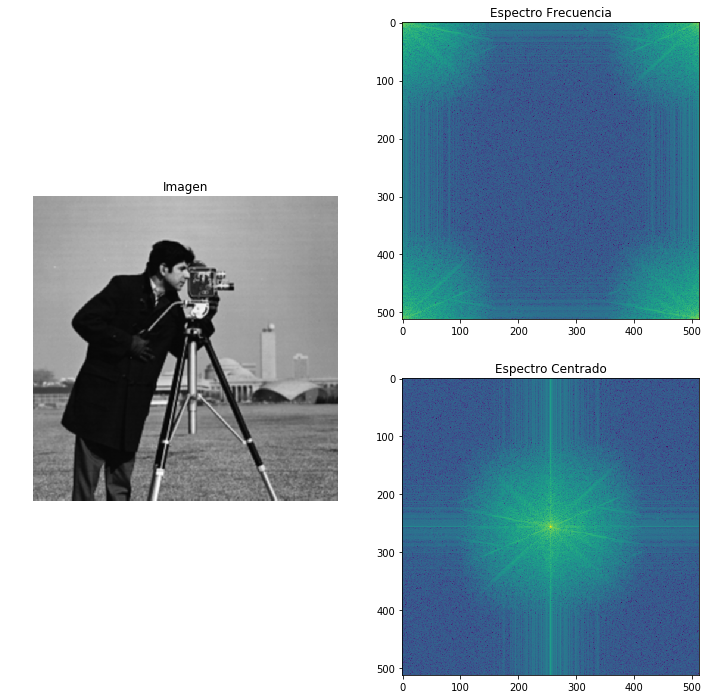

In [48]:
# Tamaño del kernel
sz = 3
k_media = np.ones((sz, sz)) * 1/(sz*sz)
 
media = ndimage.convolve(camera, k_media, output='int32')
mostrar_frecuencia(media)

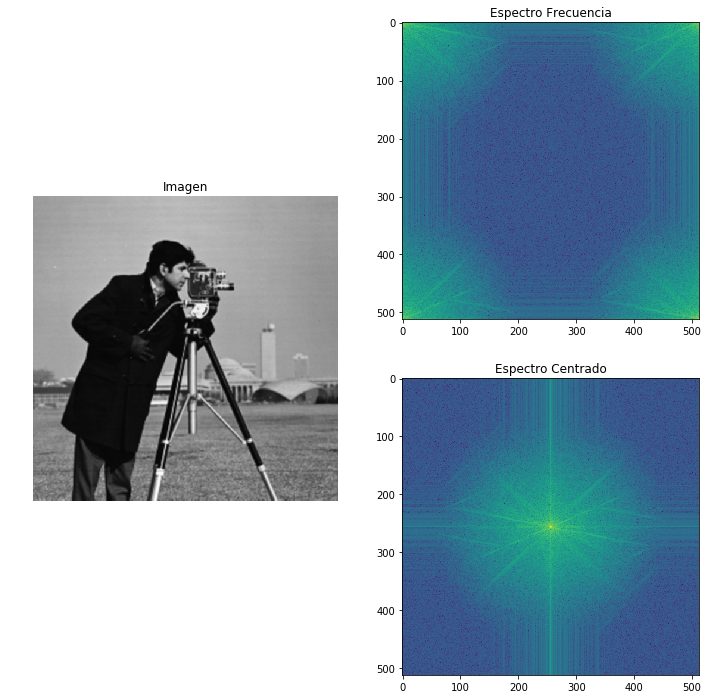

In [49]:
# Blur
k_blur = [[0.0625, 0.125, 0.0625],
         [0.125, 0.25, 0.125],
         [0.0625, 0.125, 0.0625]]

blur = ndimage.convolve(camera, k_blur, )
mostrar_frecuencia(blur)

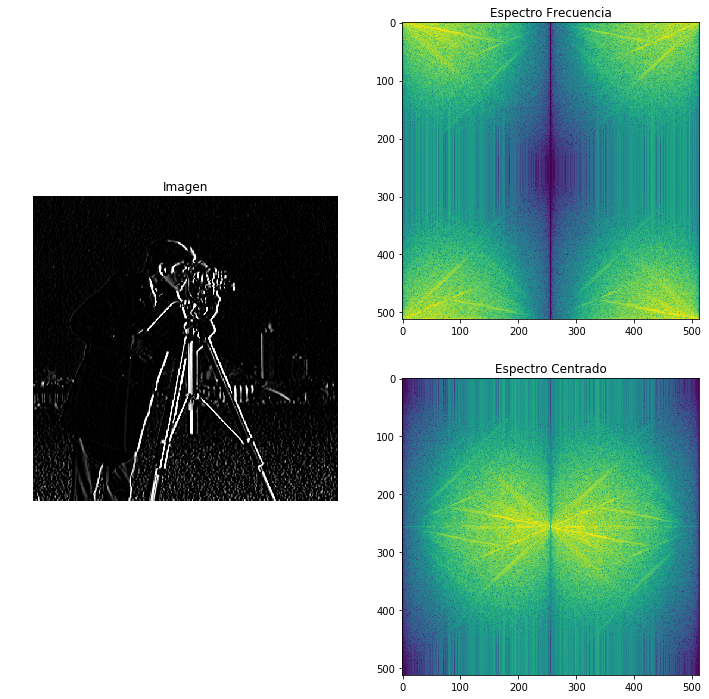

In [50]:
# Sobel horizontal
k_sobel_h = [[1, 0, -1],
             [2, 0, -2],
             [1, 0, -1]]

sobel_h = ndimage.convolve(camera, k_sobel_h, output='int32')
mostrar_frecuencia(sobel_h)

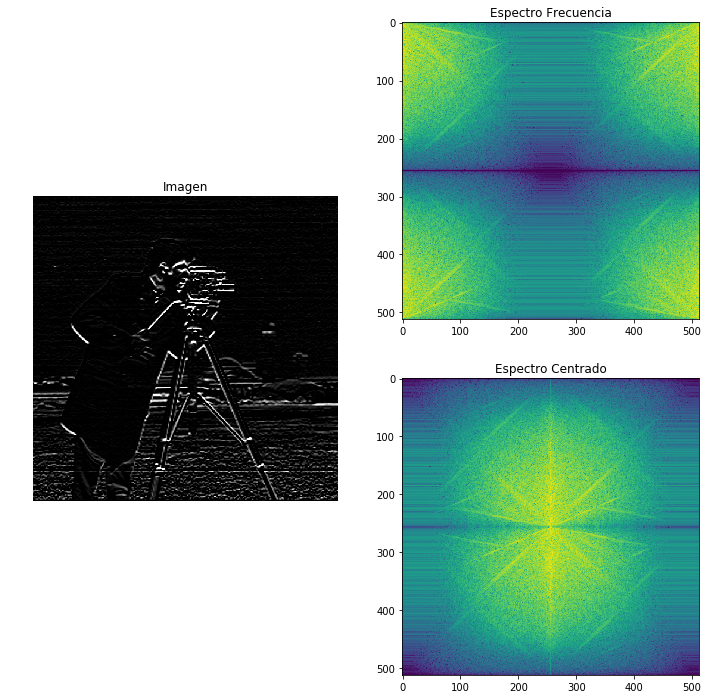

In [51]:
# Sobel vertical
k_sobel_v = [[1, 2, 1],
             [0, 0, 0],
             [-1, -2, -1]]

sobel_v = ndimage.convolve(camera, k_sobel_v, output='int32')
mostrar_frecuencia(sobel_v)

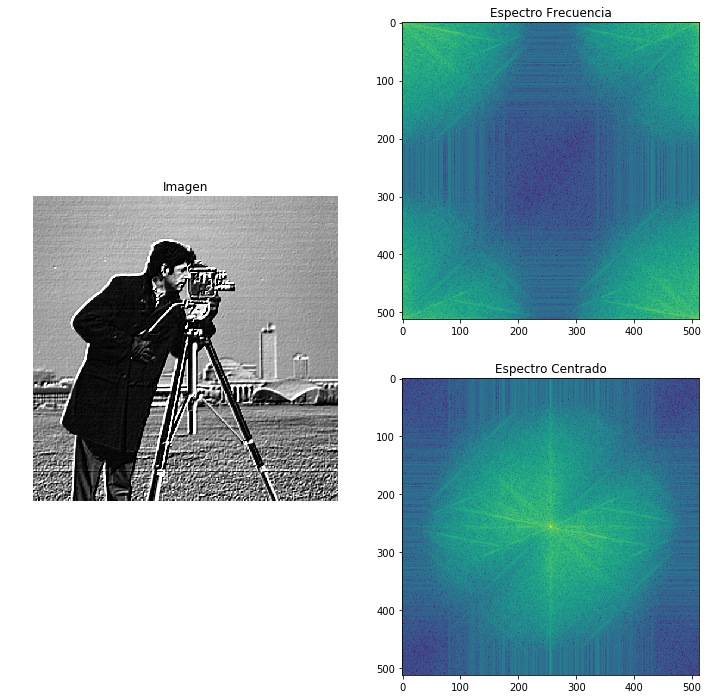

In [52]:
# Realce
k_realce = [[-2, -1, 0],
           [-1, 1, 1],
           [0, 1, 2]]

realce = ndimage.convolve(camera, k_realce, output='int32')
mostrar_frecuencia(realce)

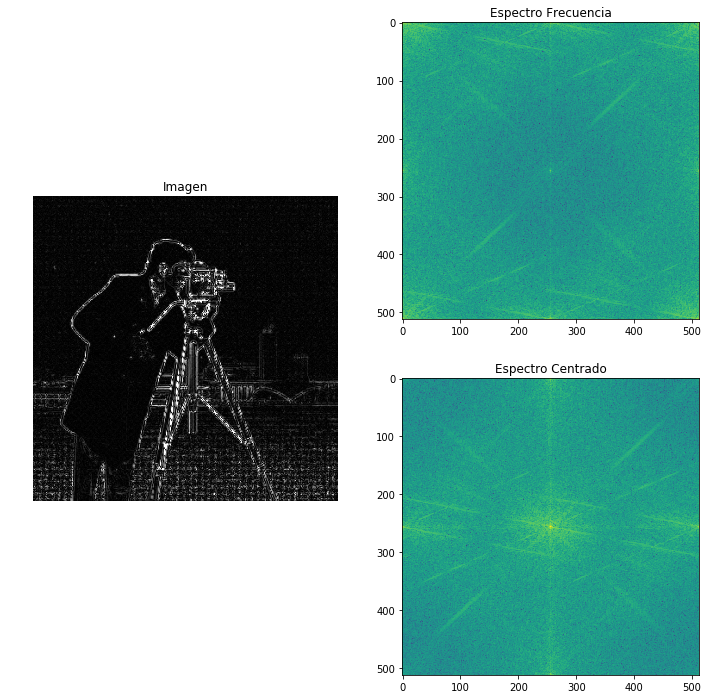

In [53]:
# Diferencia
k_bordes = [[-1, -1, -1],
             [-1, 8, -1],
             [-1, -1, -1]]

bordes = ndimage.convolve(camera, k_bordes, output='int32')
mostrar_frecuencia(np.abs(bordes))

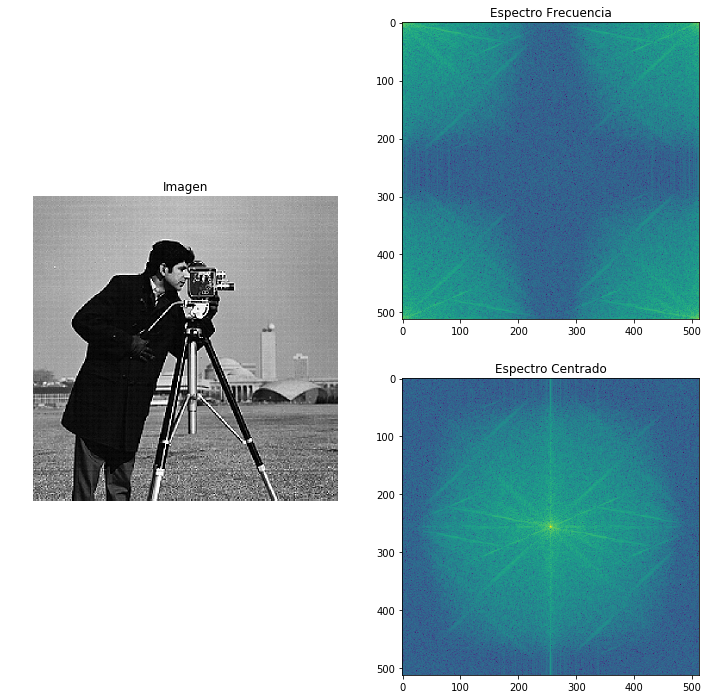

In [54]:
k_enfasis = [[0, -1, 0],
            [-1, 5, -1],
            [0, -1, 0]]

enfasis = ndimage.convolve(camera, k_enfasis, output='int32')
mostrar_frecuencia(enfasis)

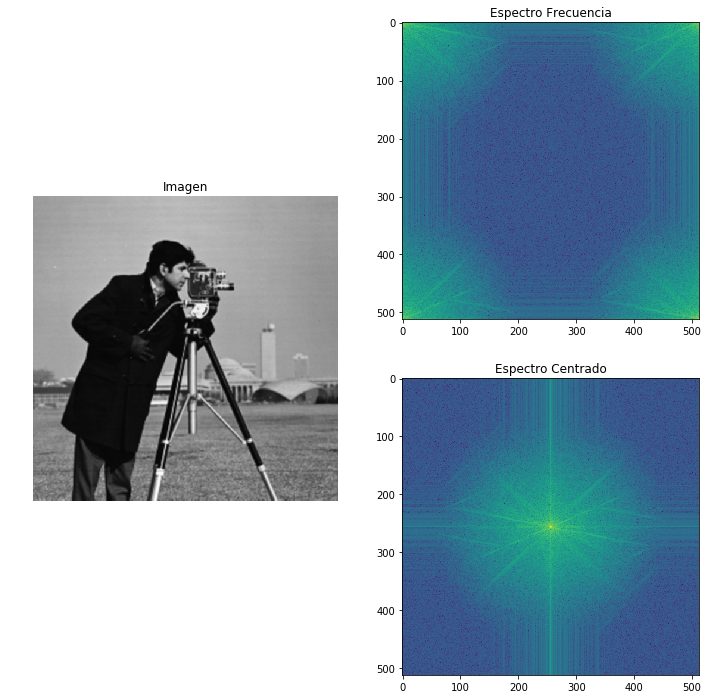

In [55]:
# Gaussiano
k_gauss = [[1/16, 1/8, 1/16],
              [1/8, 1/4, 1/8],
              [1/16, 1/8, 1/16]]

gauss = ndimage.convolve(camera, k_gauss, output='int32')
mostrar_frecuencia(gauss)

#### Filtros estadísticos
Los filtros estadísticos sirven usando una función estadística sobre los valores de una localidad alrededor del pixel, este tamaño de ventana es definido por el usuario. 

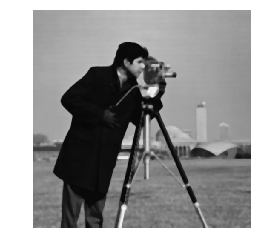

In [56]:
# Filtro mediana
def filtro_mediana(sz):
    #thr = 60
    #ax.clear()
    plt.figure(1, figsize=(6,4))
    mediana = ndimage.median_filter(camera, size=sz)
    plt.imshow(mediana, cmap='gray', 
               vmin=0, vmax=255)
    plt.axis('off')
    plt.show()

interactive_plot = widgets.interactive(filtro_mediana, sz=(3, 11))
output=interactive_plot.children[-1]
interactive_plot

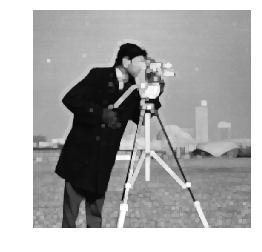

In [57]:
# Filtro maximo
def filtro_maximo(sz):
    #thr = 60
    #ax.clear()
    plt.figure(1, figsize=(6,4))
    mediana = ndimage.maximum_filter(camera, size=sz)
    plt.imshow(mediana, cmap='gray', 
               vmin=0, vmax=255)
    plt.axis('off')
    plt.show()

interactive_plot = widgets.interactive(filtro_maximo, sz=(3, 11))
output=interactive_plot.children[-1]
interactive_plot

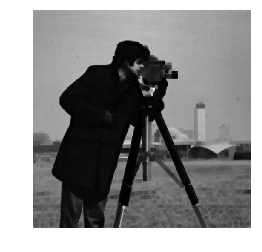

In [58]:
# Filtro maximo
def filtro_minimo(sz):
    #thr = 60
    #ax.clear()
    plt.figure(1, figsize=(6,4))
    mediana = ndimage.minimum_filter(camera, size=sz)
    plt.imshow(mediana, cmap='gray', 
               vmin=0, vmax=255)
    plt.axis('off')
    plt.show()

interactive_plot = widgets.interactive(filtro_minimo, sz=(3, 11))
output=interactive_plot.children[-1]
interactive_plot

### Operaciones Morfológicas

Las operaciones morfológicas aplican una máscara local a la imagen sobre los pixeles, esta puede ser alpicada sobre imagenes binarias o en escala de grises. Algunas de las operaciones morfológicas son las siguientes:

* Erosión: Borra contornos de las objetos en las imágenes.
* Dilatación: Añade elementos a los contornos de las imágenes.
* Cerradura: Dilatación seguida de erosión, completa agujeros en la imagen.
* Apertura: Erosión seguida por dilatación, elimina pequeños elementos de la imagen.

(-0.5, 511.5, 511.5, -0.5)

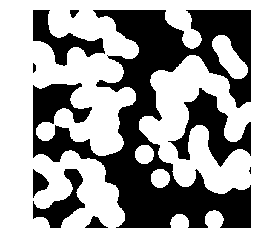

In [59]:
blobs = data.binary_blobs()
plt.imshow(blobs, cmap='gray')
plt.axis('off')

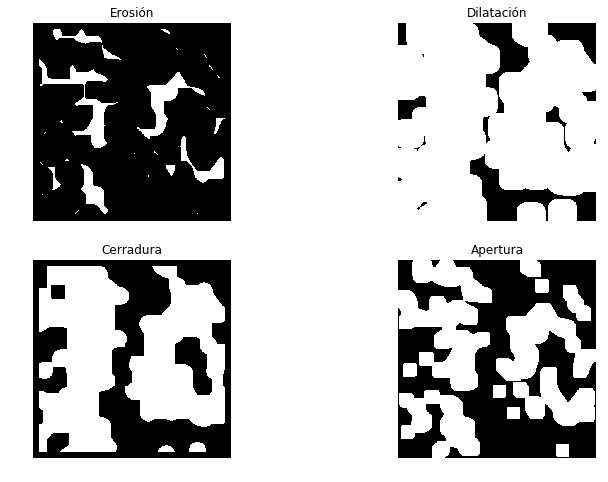

In [60]:
# Estructuras
cruz = [[0,1,0],
        [1,1,1],
        [0,1,0]]

bloque = np.ones((3,3))

# Iteraciones
iterations = 15

operaciones = [ndimage.binary_erosion, ndimage.binary_dilation, 
               ndimage.binary_closing, ndimage.binary_opening]

titulos = ['Erosión', 'Dilatación',
          'Cerradura', 'Apertura']

plt.figure(figsize=(12,8))
for i, c in enumerate(operaciones):
    plt.subplot(2, 2, i+1)
    erosion = c(blobs, structure=bloque,
                iterations=iterations)
    plt.imshow(erosion, cmap='gray')
    plt.title(titulos[i])
    plt.axis('off')

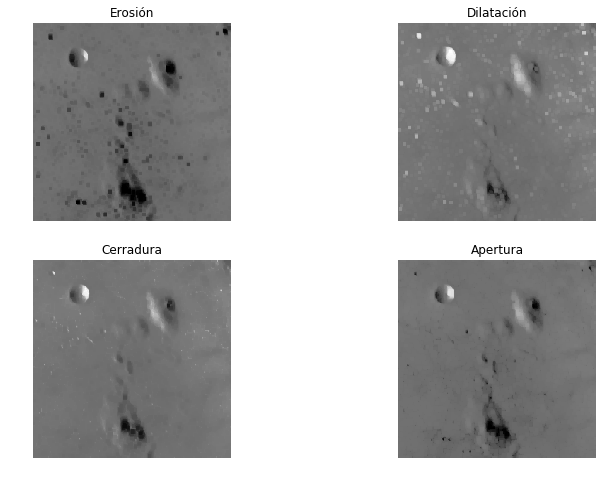

In [61]:
moon = data.moon()

sz = 7

operaciones = [ndimage.grey_erosion, ndimage.grey_dilation, 
               ndimage.grey_closing, ndimage.grey_opening]

titulos = ['Erosión', 'Dilatación',
          'Cerradura', 'Apertura']

plt.figure(figsize=(12,8))
for i, c in enumerate(operaciones):
    plt.subplot(2, 2, i+1)
    mor = c(moon, size=sz,
            output='int32')
    plt.imshow(mor, cmap='gray',
              vmin=0, vmax=255)
    plt.title(titulos[i])
    plt.axis('off')

## Ejercicios I

1. En el primer ejemplo se presentan 3 señales (senoidal, cuadrada y triangular). 
    Repite el ejemplo variando la frecuencia de muestreo "fs" a los siguientes valores: 5,10,100
2. Aplica la transformada de Fourier a cada una de las senoides del ejercicio anterior.
3. Abrir el archivo de audio another3.wav y reproducirlo.
4. Aplica psd y fft al audio anterior, varia el parametro NFFT y ventana para psd; y varia el parametro n de fft .
5. Descompón el audio en 4 niveles (3 detales y 1 aproximación) utilizando wavelets

6. Diseña un filtro pasa altas de cualquier clase y analiza su respuesta en un diagrama de bode.    
   Repite el procedimiento pero el parametro analog='True', retiralo o cambialo por 'False'.       
   *Detalles del uso de filtros digitales*
   Compara los coeficientes de ambos filtros
7. Carga una imagen, cambia los valores de Tono en formato hsv    
   (Cambiando todos por el mismo valor o el complemento del actual)       
   Despliega la imagen en rgb
8. Aplica una mascara para obtener los bordes de tu imagen.


## Ejercicios II

1. Empleando la información obtenida en los puntos 4 y 5 de la parte 1: 
    Decide que tipo de filtro usar para limpiar el ruido de la señal y   
    limpia la señal de audio.
2. El comando wavfile.write  nos permite guardar una señal de audio, sus argumentos son (variable tipo int16):
> wavfile.write('Nombre_archivo.formato',frecuencia de muestreo,nombre de la variable)

3. Abre el archivo del Class3d/robin_1.wav. Aplica un espectrograma para encontrar los tiempos y las frecuencias que corresponden al sónido del ave.  
   Corrobora tu resultado aplicando fft sobre una sección recortada de la señal. (Aisla un pitido)
   Aplica un filtro pasabandas para extraer la parte correspondiente al pitido del ave.
   Aplica un filtro estádistico (Wiener o media) para predecir la señal.
   Compara los resultados escuchando la señal antes y después de la aplicación de cada filtro.
4. Abre la imagen de rayos X Calss3D/xray.jpeg.
    * Usa primero los filtros visto y comprueba cómo cambia con cada uno de ellos y si mejora o empeora la calidad.
    * Usando sucesivamente filtros, encuentra una combinación para mejorar la definición de los huesos (sugerencia: usar énfasis y mediana).
    * Obtén el gradiente de la imagen al hacer la norma de las imágenes resultantes de los filtros Sobel. Es decir $G = \sqrt{G_x(Ima)^2+G_y(Ima)^2}$
5. Haz la binarización de la imagen _coins_, a la imagen resultante alpica operaciones morfológicas para dejar solo las monedas y que estas estén rellenas. (Sugerencia: aplicar corrección gamma al inicio)